# EDA - Exploratory Data Analysis
Version: 5.00 - May 9th, 2020
<br>As of 4/17/2020 I use data from [Johns Hopkins CSSE](https://github.com/CSSEGISandData/COVID-19)


In [1]:
import gc
import os
from pathlib import Path
import random
import sys

from tqdm.notebook import tqdm
import numpy as np
import pandas as pd
import scipy as sp


import matplotlib.pyplot as plt
import seaborn as sns

from IPython.core.display import display, HTML

# --- plotly ---
from plotly import tools, subplots
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
import plotly.io as pio
pio.templates.default = "plotly_dark"

# --- models ---
from sklearn import preprocessing
from sklearn.model_selection import KFold
import lightgbm as lgb
import xgboost as xgb
import catboost as cb

# --- setup ---
pd.set_option('max_columns', 50)

### Load Data 

In [2]:
# Input data files are available in the "../input/" directory.
import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     filenames.sort()
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

In [3]:
%%time
import requests

for filename in ['time_series_covid19_confirmed_global.csv',
                 'time_series_covid19_deaths_global.csv',
                 'time_series_covid19_recovered_global.csv',
                 'time_series_covid19_confirmed_US.csv',
                 'time_series_covid19_deaths_US.csv']:
    print(f'Downloading {filename}')
    url = f'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/{filename}'
    myfile = requests.get(url)
    open(filename, 'wb').write(myfile.content)

Wall time: 758 ms


In [4]:
from datetime import datetime

def _convert_date_str(df):
    try:
        df.columns = list(df.columns[:4]) + [datetime.strptime(d, "%m/%d/%y").date().strftime("%Y-%m-%d") for d in df.columns[4:]]
    except:
        print('_convert_date_str failed with %y, try %Y')
        df.columns = list(df.columns[:4]) + [datetime.strptime(d, "%m/%d/%Y").date().strftime("%Y-%m-%d") for d in df.columns[4:]]


confirmed_global_df = pd.read_csv('time_series_covid19_confirmed_global.csv')
_convert_date_str(confirmed_global_df)

deaths_global_df = pd.read_csv('time_series_covid19_deaths_global.csv')
_convert_date_str(deaths_global_df)

recovered_global_df = pd.read_csv('time_series_covid19_recovered_global.csv')
_convert_date_str(recovered_global_df)

In [5]:
# Filter out problematic data points (The West Bank and Gaza had a negative value, cruise ships were associated with Canada, etc.)
removed_states = "Recovered|Grand Princess|Diamond Princess"
removed_countries = "US|The West Bank and Gaza"

confirmed_global_df.rename(columns={"Province/State": "Province_State", "Country/Region": "Country_Region"}, inplace=True)
deaths_global_df.rename(columns={"Province/State": "Province_State", "Country/Region": "Country_Region"}, inplace=True)
recovered_global_df.rename(columns={"Province/State": "Province_State", "Country/Region": "Country_Region"}, inplace=True)

confirmed_global_df = confirmed_global_df[~confirmed_global_df["Province_State"].replace(np.nan, "nan").str.match(removed_states)]
deaths_global_df    = deaths_global_df[~deaths_global_df["Province_State"].replace(np.nan, "nan").str.match(removed_states)]
recovered_global_df = recovered_global_df[~recovered_global_df["Province_State"].replace(np.nan, "nan").str.match(removed_states)]

confirmed_global_df = confirmed_global_df[~confirmed_global_df["Country_Region"].replace(np.nan, "nan").str.match(removed_countries)]
deaths_global_df    = deaths_global_df[~deaths_global_df["Country_Region"].replace(np.nan, "nan").str.match(removed_countries)]
recovered_global_df = recovered_global_df[~recovered_global_df["Country_Region"].replace(np.nan, "nan").str.match(removed_countries)]

In [6]:
confirmed_global_melt_df = confirmed_global_df.melt(
    id_vars=['Country_Region', 'Province_State', 'Lat', 'Long'], value_vars=confirmed_global_df.columns[4:], var_name='Date', value_name='ConfirmedCases')
deaths_global_melt_df = deaths_global_df.melt(
    id_vars=['Country_Region', 'Province_State', 'Lat', 'Long'], value_vars=confirmed_global_df.columns[4:], var_name='Date', value_name='Deaths')
recovered_global_melt_df = deaths_global_df.melt(
    id_vars=['Country_Region', 'Province_State', 'Lat', 'Long'], value_vars=confirmed_global_df.columns[4:], var_name='Date', value_name='Recovered')

In [7]:
train = confirmed_global_melt_df.merge(deaths_global_melt_df, on=['Country_Region', 'Province_State', 'Lat', 'Long', 'Date'])
train = train.merge(recovered_global_melt_df, on=['Country_Region', 'Province_State', 'Lat', 'Long', 'Date'])

In [8]:
# --- US ---
confirmed_us_df = pd.read_csv('time_series_covid19_confirmed_US.csv')
deaths_us_df = pd.read_csv('time_series_covid19_deaths_US.csv')

confirmed_us_df.drop(['UID', 'iso2', 'iso3', 'code3', 'FIPS', 'Admin2', 'Combined_Key'], inplace=True, axis=1)
deaths_us_df.drop(['UID', 'iso2', 'iso3', 'code3', 'FIPS', 'Admin2', 'Combined_Key', 'Population'], inplace=True, axis=1)

confirmed_us_df.rename({'Long_': 'Long'}, axis=1, inplace=True)
deaths_us_df.rename({'Long_': 'Long'}, axis=1, inplace=True)

_convert_date_str(confirmed_us_df)
_convert_date_str(deaths_us_df)

# clean
confirmed_us_df = confirmed_us_df[~confirmed_us_df.Province_State.str.match("Diamond Princess|Grand Princess|Recovered|Northern Mariana Islands|American Samoa")]
deaths_us_df = deaths_us_df[~deaths_us_df.Province_State.str.match("Diamond Princess|Grand Princess|Recovered|Northern Mariana Islands|American Samoa")]

# --- Aggregate by province state ---
#confirmed_us_df.groupby(['Country_Region', 'Province_State'])
confirmed_us_df = confirmed_us_df.groupby(['Country_Region', 'Province_State']).sum().reset_index()
deaths_us_df = deaths_us_df.groupby(['Country_Region', 'Province_State']).sum().reset_index()

# remove lat, long.
confirmed_us_df.drop(['Lat', 'Long'], inplace=True, axis=1)
deaths_us_df.drop(['Lat', 'Long'], inplace=True, axis=1)

confirmed_us_melt_df = confirmed_us_df.melt(
    id_vars=['Country_Region', 'Province_State'], value_vars=confirmed_us_df.columns[2:], var_name='Date', value_name='ConfirmedCases')
deaths_us_melt_df = deaths_us_df.melt(
    id_vars=['Country_Region', 'Province_State'], value_vars=deaths_us_df.columns[2:], var_name='Date', value_name='Deaths')

train_us = confirmed_us_melt_df.merge(deaths_us_melt_df, on=['Country_Region', 'Province_State', 'Date'])

In [9]:
train = pd.concat([train, train_us], axis=0, sort=False)

train_us.rename({'Country_Region': 'country', 'Province_State': 'province', 'Date': 'date', 'ConfirmedCases': 'confirmed', 'Deaths': 'fatalities'}, axis=1, inplace=True)
train_us['country_province'] = train_us['country'].fillna('') + '/' + train_us['province'].fillna('')

In [10]:
train

,Country_Region,Province_State,Lat,Long,Date,ConfirmedCases,Deaths,Recovered
0,Afghanistan,NaN,33.0000,65.0000,2020-01-22,0,0,0.0
1,Albania,NaN,41.1533,20.1683,2020-01-22,0,0,0.0
2,Algeria,NaN,28.0339,1.6596,2020-01-22,0,0,0.0
3,Andorra,NaN,42.5063,1.5218,2020-01-22,0,0,0.0
4,Angola,NaN,-11.2027,17.8739,2020-01-22,0,0,0.0
...,...,...,...,...,...,...,...,...
5827,US,Virginia,NaN,NaN,2020-05-08,22342,812,NaN
5828,US,Washington,NaN,NaN,2020-05-08,16388,905,NaN
5829,US,West Virginia,NaN,NaN,2020-05-08,1323,52,NaN
5830,US,Wisconsin,NaN,NaN,2020-05-08,9590,384,NaN


In [11]:
%%time
datadir = Path('/kaggle/input/covid19-global-forecasting-week-4')

# Read in the data CSV files
#train = pd.read_csv(datadir/'train.csv')
#test = pd.read_csv(datadir/'test.csv')
#submission = pd.read_csv(datadir/'submission.csv')

Wall time: 0 ns


In [12]:
train

,Country_Region,Province_State,Lat,Long,Date,ConfirmedCases,Deaths,Recovered
0,Afghanistan,NaN,33.0000,65.0000,2020-01-22,0,0,0.0
1,Albania,NaN,41.1533,20.1683,2020-01-22,0,0,0.0
2,Algeria,NaN,28.0339,1.6596,2020-01-22,0,0,0.0
3,Andorra,NaN,42.5063,1.5218,2020-01-22,0,0,0.0
4,Angola,NaN,-11.2027,17.8739,2020-01-22,0,0,0.0
...,...,...,...,...,...,...,...,...
5827,US,Virginia,NaN,NaN,2020-05-08,22342,812,NaN
5828,US,Washington,NaN,NaN,2020-05-08,16388,905,NaN
5829,US,West Virginia,NaN,NaN,2020-05-08,1323,52,NaN
5830,US,Wisconsin,NaN,NaN,2020-05-08,9590,384,NaN


In [13]:
train.rename({'Country_Region': 'country', 'Province_State': 'province', 'Id': 'id', 'Date': 'date', 'ConfirmedCases': 'confirmed', 'Deaths': 'fatalities', 'Recovered': 'recovered'}, axis=1, inplace=True)
train['country_province'] = train['country'].fillna('') + '/' + train['province'].fillna('')

# test.rename({'Country_Region': 'country', 'Province_State': 'province', 'Id': 'id', 'Date': 'date', 'ConfirmedCases': 'confirmed', 'Fatalities': 'fatalities'}, axis=1, inplace=True)
# test['country_province'] = test['country'].fillna('') + '/' + test['province'].fillna('')

In [14]:
ww_df = train.groupby('date')[['confirmed', 'fatalities']].sum().reset_index()
ww_df['new_case'] = ww_df['confirmed'] - ww_df['confirmed'].shift(1)
ww_df.tail()

,date,confirmed,fatalities,new_case
103,2020-05-04,3582875,251531,76326.0
104,2020-05-05,3662511,257233,79636.0
105,2020-05-06,3755160,263825,92649.0
106,2020-05-07,3845537,269561,90377.0
107,2020-05-08,3937883,274892,92346.0


## Worldwide Trend

In [15]:
ww_melt_df = pd.melt(ww_df, id_vars=['date'], value_vars=['confirmed', 'fatalities', 'new_case'])
ww_melt_df

,date,variable,value
0,2020-01-22,confirmed,555.0
1,2020-01-23,confirmed,654.0
2,2020-01-24,confirmed,941.0
3,2020-01-25,confirmed,1434.0
4,2020-01-26,confirmed,2118.0
...,...,...,...
319,2020-05-04,new_case,76326.0
320,2020-05-05,new_case,79636.0
321,2020-05-06,new_case,92649.0
322,2020-05-07,new_case,90377.0


In [16]:
fig = px.line(ww_melt_df, x="date", y="value", color='variable', 
              title="Worldwide Confirmed/Death Cases Over Time")
fig.show()

In [17]:
fig = px.line(ww_melt_df, x="date", y="value", color='variable',
              title="Worldwide Confirmed/Death Cases Over Time (Log scale)",
             log_y=True)
fig.show()

#### The fatalities curve seems to just be a shift of the curve for confirmed cases, meaning that mortality rate is almost constant. 

In [18]:
ww_df['mortality'] = ww_df['fatalities'] / ww_df['confirmed']

fig = px.line(ww_df, x="date", y="mortality", 
              title="Worldwide Mortality Rate Over Time")
fig.show()

#### Seems that the Mortality Rate peaked at 7% and is retracting back down below
## Country-Wide Growth

In [19]:
country_df = train.groupby(['date', 'country'])[['confirmed', 'fatalities']].sum().reset_index()
country_df.tail()

,date,country,confirmed,fatalities
20191,2020-05-08,West Bank and Gaza,375,2
20192,2020-05-08,Western Sahara,6,0
20193,2020-05-08,Yemen,34,7
20194,2020-05-08,Zambia,167,4
20195,2020-05-08,Zimbabwe,34,4


In [20]:
countries = country_df['country'].unique()
print(f'{len(countries)} countries are in dataset:\n{countries}')

187 countries are in dataset:
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia' 'Bosnia and Herzegovina'
 'Botswana' 'Brazil' 'Brunei' 'Bulgaria' 'Burkina Faso' 'Burma' 'Burundi'
 'Cabo Verde' 'Cambodia' 'Cameroon' 'Canada' 'Central African Republic'
 'Chad' 'Chile' 'China' 'Colombia' 'Comoros' 'Congo (Brazzaville)'
 'Congo (Kinshasa)' 'Costa Rica' "Cote d'Ivoire" 'Croatia' 'Cuba' 'Cyprus'
 'Czechia' 'Denmark' 'Diamond Princess' 'Djibouti' 'Dominica'
 'Dominican Republic' 'Ecuador' 'Egypt' 'El Salvador' 'Equatorial Guinea'
 'Eritrea' 'Estonia' 'Eswatini' 'Ethiopia' 'Fiji' 'Finland' 'France'
 'Gabon' 'Gambia' 'Georgia' 'Germany' 'Ghana' 'Greece' 'Grenada'
 'Guatemala' 'Guinea' 'Guinea-Bissau' 'Guyana' 'Haiti' 'Holy See'
 'Honduras' 'Hungary' 'Iceland' 'India' 'Indonesia' 'Iran' 'Iraq'
 'Ireland' 'Israel'

In [21]:
target_date = country_df['date'].max()

print('Date: ', target_date)
for i in [1, 10, 100, 1000, 10000]:
    n_countries = len(country_df.query('(date == @target_date) & confirmed > @i'))
    print(f'{n_countries} countries have more than {i} confirmed cases')

Date:  2020-05-08
187 countries have more than 1 confirmed cases
180 countries have more than 10 confirmed cases
149 countries have more than 100 confirmed cases
90 countries have more than 1000 confirmed cases
41 countries have more than 10000 confirmed cases


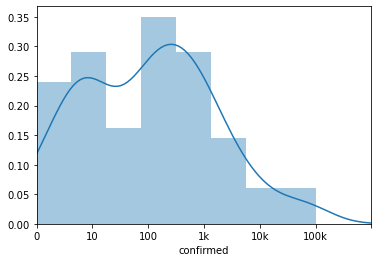

In [22]:
ax = sns.distplot(np.log10(country_df.query('date == "2020-03-27"')['confirmed'] + 1))
ax.set_xlim([0, 6])
ax.set_xticks(np.arange(7))
_ = ax.set_xticklabels(['0', '10', '100', '1k', '10k', '100k'])

In [23]:
top_country_df = country_df.query('(date == @target_date) & (confirmed > 1000)').sort_values('confirmed', ascending=False)
top_country_melt_df = pd.melt(top_country_df, id_vars='country', value_vars=['confirmed', 'fatalities'])

In [24]:
fig = px.bar(top_country_melt_df.iloc[::-1],
             x='value', y='country', color='variable', barmode='group',
             title=f'Confirmed Cases/Deaths on {target_date}', text='value', height=1500, orientation='h')
fig.show()

In [85]:
top30_countries = top_country_df.sort_values('confirmed', ascending=False).iloc[:30]['country'].unique()
top30_countries_df = country_df[country_df['country'].isin(top30_countries)]
fig = px.line(top30_countries_df,
              x='date', y='confirmed', color='country',
              title=f'Confirmed Cases for top 30 country as of {target_date}')
fig.show()

#### Seems every other country has reached the flat end of the curve before reaching a quarter-million infected. The US continues to rise above 1.2 million, however, if you look carefully, you can see that the US's curve is becoming a line. This means its second-derivative has hit 1.

In [86]:
top30_countries = top_country_df.sort_values('fatalities', ascending=False).iloc[:30]['country'].unique()
top30_countries_df = country_df[country_df['country'].isin(top30_countries)]
fig = px.line(top30_countries_df,
              x='date', y='fatalities', color='country',
              title=f'Fatalities for top 30 country as of {target_date}')
fig.show()

### We see that in terms of fatalities, Europe is more serious than the US right now
#### Let's look at mortality rate by country

In [27]:
top_country_df = country_df.query('(date == @target_date) & (confirmed > 100)')
top_country_df['mortality_rate'] = top_country_df['fatalities'] / top_country_df['confirmed']
top_country_df = top_country_df.sort_values('mortality_rate', ascending=False)

In [28]:
fig = px.bar(top_country_df[:30].iloc[::-1],
             x='mortality_rate', y='country',
             title=f'Mortality rate HIGH: top 30 countries on {target_date}', text='mortality_rate', height=800, orientation='h')
fig.show()

#### Seems as though Belgium, France, UK, Italy, Netherlands, Sweden, Hungary, and Spain (European countries) have a 10-16% mortality rate. This is is 2-3x as high as the US. 
##### Maybe we can look at countries whose mortality rates are low for insight. Though, many of these countries simply do not report/measure fatalities properly.

In [29]:
fig = px.bar(top_country_df[-30:],
             x='mortality_rate', y='country',
             title=f'Mortality rate LOW: top 30 countries on {target_date}', text='mortality_rate', height=800, orientation='h')
fig.show()

#### Either the rates in tropical countries are low which leads to my hypothesis of the negative correlation between COVID-19 spread and temperature, humidity, # hours of daylight, and wind speed. However, it is just as likely, if not more, that these countries simply do not test as widely as the other Western nations.

In [30]:
all_country_df = country_df.query('date == @target_date')
all_country_df['confirmed_log1p'] = np.log10(all_country_df['confirmed'] + 1)
all_country_df['fatalities_log1p'] = np.log10(all_country_df['fatalities'] + 1)
all_country_df['mortality_rate'] = all_country_df['fatalities'] / all_country_df['confirmed']

In [74]:
fig = px.choropleth(all_country_df, locations="country", 
                    locationmode='country names', color="confirmed_log1p", 
                    hover_name="country", hover_data=["confirmed", 'fatalities', 'mortality_rate'],
                    range_color=[all_country_df['confirmed_log1p'].min(), all_country_df['confirmed_log1p'].max()], 
                    color_continuous_scale="bluered", 
                    title='Countries with Confirmed Cases')

# I'd like to update colorbar to show raw values, but this does not work somehow...
# Please let me know if you know how to do this!!
trace1 = list(fig.select_traces())[0]
trace1.colorbar = go.choropleth.ColorBar(
    tickvals=[0, 1, 2, 3, 4, 5],
    ticktext=['1', '10', '100', '1000','10000', '10000'])
fig.show()

In [75]:
fig = px.choropleth(all_country_df, locations="country", 
                    locationmode='country names', color="fatalities_log1p", 
                    hover_name="country", range_color=[0, 4],
                    hover_data=['confirmed', 'fatalities', 'mortality_rate'],
                    color_continuous_scale="bluered", 
                    title='Countries with fatalities')
fig.show()

In [76]:
fig = px.choropleth(all_country_df, locations="country", 
                    locationmode='country names', color="mortality_rate", 
                    hover_name="country", range_color=[0, 0.12], 
                    color_continuous_scale="bluered", 
                    title='Countries with mortality rate')
fig.show()

In [77]:
n_countries = 20
n_start_death = 10
fatality_top_countires = top_country_df.sort_values('fatalities', ascending=False).iloc[:n_countries]['country'].values
country_df['date'] = pd.to_datetime(country_df['date'])


df_list = []
for country in fatality_top_countires:
    this_country_df = country_df.query('country == @country')
    start_date = this_country_df.query('fatalities > @n_start_death')['date'].min()
    this_country_df = this_country_df.query('date >= @start_date')
    this_country_df['date_since'] = this_country_df['date'] - start_date
    this_country_df['fatalities_log1p'] = np.log10(this_country_df['fatalities'] + 1)
    this_country_df['fatalities_log1p'] -= this_country_df['fatalities_log1p'].values[0]
    df_list.append(this_country_df)

tmpdf = pd.concat(df_list)
tmpdf['date_since_days'] = tmpdf['date_since'] / pd.Timedelta('1 days')

In [87]:
fig = px.line(tmpdf,
              x='date_since_days', y='fatalities_log1p', color='country',
              title=f'Fatalities by country since 10 deaths, as of {target_date}')
fig.add_trace(go.Scatter(x=[0, 21], y=[0, 3], name='Double by 7 days', line=dict(dash='dash', color=('rgb(200, 200, 200)'))))
fig.add_trace(go.Scatter(x=[0, 42], y=[0, 3], name='Double by 14 days', line=dict(dash='dash', color=('rgb(200, 200, 200)'))))
fig.add_trace(go.Scatter(x=[0, 63], y=[0, 3], name='Double by 21 days', line=dict(dash='dash', color=('rgb(200, 200, 200)'))))
fig.show()

In [88]:
country_df['prev_confirmed'] = country_df.groupby('country')['confirmed'].shift(1)
country_df['new_case'] = country_df['confirmed'] - country_df['prev_confirmed']
country_df['new_case'].fillna(0, inplace=True)
top30_country_df = country_df[country_df['country'].isin(top30_countries)]

fig = px.line(top30_country_df,
              x='date', y='new_case', color='country',
              title=f'DAILY NEW Confirmed cases world wide')
fig.show()

#### We see that jagged pink line representing the daily new cases for the US. A best fit line average would be slightly lower than 30k, which is a notable improvement from 35k back when I first ran this code in April 12th.

In [37]:
country_df['date'] = country_df['date'].apply(str)
country_df['confirmed_log1p'] = np.log1p(country_df['confirmed'])
country_df['fatalities_log1p'] = np.log1p(country_df['fatalities'])

fig = px.scatter_geo(country_df, locations="country", locationmode='country names', 
                     color="confirmed", size='confirmed', hover_name="country", 
                     hover_data=['confirmed', 'fatalities'],
                     range_color= [0, country_df['confirmed'].max()], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Confirmed cases spread Over Time', color_continuous_scale="portland")
# fig.update(layout_coloraxis_showscale=False)
fig.show()

In [38]:
fig = px.scatter_geo(country_df, locations="country", locationmode='country names', 
                     color="fatalities", size='fatalities', hover_name="country", 
                     hover_data=['confirmed', 'fatalities'],
                     range_color= [0, country_df['fatalities'].max()], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Fatalities growth Over Time', color_continuous_scale="portland")
fig.show()

In [39]:
country_df.loc[country_df['new_case'] < 0, 'new_case'] = 0.
fig = px.scatter_geo(country_df, locations="country", locationmode='country names', 
                     color="new_case", size='new_case', hover_name="country", 
                     hover_data=['confirmed', 'fatalities'],
                     range_color= [0, country_df['new_case'].max()], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Daily NEW cases over Time', color_continuous_scale="portland")
fig.show()

## Provinces 
##### Only 8 countries have province data

In [40]:
for country in countries:
    province = train.query('country == @country')['province'].unique()
    if len(province) > 1:       
        print(f'Country {country} has {len(province)} provinces: {province}')

Country Australia has 8 provinces: ['Australian Capital Territory' 'New South Wales' 'Northern Territory'
 'Queensland' 'South Australia' 'Tasmania' 'Victoria' 'Western Australia']
Country Canada has 12 provinces: ['Alberta' 'British Columbia' 'Manitoba' 'New Brunswick'
 'Newfoundland and Labrador' 'Nova Scotia' 'Ontario'
 'Prince Edward Island' 'Quebec' 'Saskatchewan' 'Northwest Territories'
 'Yukon']
Country China has 33 provinces: ['Anhui' 'Beijing' 'Chongqing' 'Fujian' 'Gansu' 'Guangdong' 'Guangxi'
 'Guizhou' 'Hainan' 'Hebei' 'Heilongjiang' 'Henan' 'Hong Kong' 'Hubei'
 'Hunan' 'Inner Mongolia' 'Jiangsu' 'Jiangxi' 'Jilin' 'Liaoning' 'Macau'
 'Ningxia' 'Qinghai' 'Shaanxi' 'Shandong' 'Shanghai' 'Shanxi' 'Sichuan'
 'Tianjin' 'Tibet' 'Xinjiang' 'Yunnan' 'Zhejiang']
Country Denmark has 3 provinces: ['Faroe Islands' 'Greenland' nan]
Country France has 11 provinces: ['French Guiana' 'French Polynesia' 'Guadeloupe' 'Mayotte' 'New Caledonia'
 'Reunion' 'Saint Barthelemy' 'St Martin' 'Martini

## USA

In [41]:
usa_state_code_df = pd.read_csv('./usa_states2.csv')

In [42]:
train_us

,country,province,date,confirmed,fatalities,country_province
0,US,Alabama,2020-01-22,0,0,US/Alabama
1,US,Alaska,2020-01-22,0,0,US/Alaska
2,US,Arizona,2020-01-22,0,0,US/Arizona
3,US,Arkansas,2020-01-22,0,0,US/Arkansas
4,US,California,2020-01-22,0,0,US/California
...,...,...,...,...,...,...
5827,US,Virginia,2020-05-08,22342,812,US/Virginia
5828,US,Washington,2020-05-08,16388,905,US/Washington
5829,US,West Virginia,2020-05-08,1323,52,US/West Virginia
5830,US,Wisconsin,2020-05-08,9590,384,US/Wisconsin


In [43]:
# Prepare data frame only for US. 

#train_us = train.query('country == "US"')
train_us['mortality_rate'] = train_us['fatalities'] / train_us['confirmed']

# Convert province column to its 2-char code name,
state_name_to_code = dict(zip(usa_state_code_df['state_name'], usa_state_code_df['state_code']))
train_us['province_code'] = train_us['province'].map(state_name_to_code)

# Only show latest days.
train_us_latest = train_us.query('date == @target_date')

In [44]:
fig = px.choropleth(train_us_latest, locations='province_code', locationmode="USA-states",
                    color='confirmed', scope="usa", hover_data=['province', 'fatalities', 'mortality_rate'],
                    title=f'Confirmed cases in US on {target_date}')
fig.show()

In [45]:
train_us_latest.sort_values('confirmed', ascending=False)

,country,province,date,confirmed,fatalities,country_province,mortality_rate,province_code
5811,US,New York,2020-05-08,330407,26243,US/New York,0.079426,NY
5809,US,New Jersey,2020-05-08,135840,8960,US/New Jersey,0.065960,NJ
5800,US,Massachusetts,2020-05-08,75333,4702,US/Massachusetts,0.062416,MA
5792,US,Illinois,2020-05-08,73760,3241,US/Illinois,0.043940,IL
5782,US,California,2020-05-08,63779,2613,US/California,0.040970,CA
5817,US,Pennsylvania,2020-05-08,57371,3715,US/Pennsylvania,0.064754,PA
5801,US,Michigan,2020-05-08,46386,4399,US/Michigan,0.094835,MI
5787,US,Florida,2020-05-08,39199,1669,US/Florida,0.042578,FL
5823,US,Texas,2020-05-08,37246,1025,US/Texas,0.027520,TX
5784,US,Connecticut,2020-05-08,32411,2874,US/Connecticut,0.088674,CT


In [46]:
fig = px.choropleth(train_us_latest, locations='province_code', locationmode="USA-states",
                    color='mortality_rate', scope="usa", hover_data=['province', 'fatalities', 'mortality_rate'],
                    title=f'Mortality rate in US on {target_date}')
fig.show()

In [89]:
train_us_march = train_us.query('date > "2020-03-01"')
fig = px.line(train_us_march,
              x='date', y='confirmed', color='province',
              title=f'Confirmed cases by state in US, as of {target_date}')
fig.show()

## Europe

In [48]:
europe_country_list =list([
    'Austria','Belgium','Bulgaria','Croatia','Cyprus','Czechia','Denmark','Estonia','Finland','France','Germany','Greece','Hungary','Ireland',
    'Italy', 'Latvia','Luxembourg','Lithuania','Malta','Norway','Netherlands','Poland','Portugal','Romania','Slovakia','Slovenia',
    'Spain', 'Sweden', 'United Kingdom', 'Iceland', 'Russia', 'Switzerland', 'Serbia', 'Ukraine', 'Belarus',
    'Albania', 'Bosnia and Herzegovina', 'Kosovo', 'Moldova', 'Montenegro', 'North Macedonia'])

country_df['date'] = pd.to_datetime(country_df['date'])
train_europe = country_df[country_df['country'].isin(europe_country_list)]
#train_europe['date_str'] = pd.to_datetime(train_europe['date'])
train_europe_latest = train_europe.query('date == @target_date')

In [49]:
fig = px.choropleth(train_europe_latest, locations="country", 
                    locationmode='country names', color="confirmed", 
                    hover_name="country", range_color=[1, train_europe_latest['confirmed'].max()], 
                    color_continuous_scale='portland', 
                    title=f'European Countries with Confirmed Cases as of {target_date}', scope='europe', height=800)
fig.show()

In [90]:
train_europe_march = train_europe.query('date >= "2020-03-01"')
fig = px.line(train_europe_march,
              x='date', y='confirmed', color='country',
              title=f'Confirmed cases by country in Europe, as of {target_date}')
fig.show()

In [91]:
fig = px.line(train_europe_march,
              x='date', y='fatalities', color='country',
              title=f'Fatalities by country in Europe, as of {target_date}')
fig.show()

In [83]:
train_europe_march['prev_confirmed'] = train_europe_march.groupby('country')['confirmed'].shift(1)
train_europe_march['new_case'] = train_europe_march['confirmed'] - train_europe_march['prev_confirmed']
fig = px.line(train_europe_march,
              x='date', y='new_case', color='country',
              title=f'DAILY NEW Confirmed cases by country in Europe')
fig.show()

## Asia

In [53]:
country_latest = country_df.query('date == @target_date')

fig = px.choropleth(country_latest, locations="country", 
                    locationmode='country names', color="confirmed", 
                    hover_name="country", range_color=[1, 50000], 
                    color_continuous_scale='portland', 
                    title=f'Asian Countries with Confirmed Cases as of {target_date}', scope='asia', height=800)
fig.show()

In [54]:
top_asian_country_df = country_df[country_df['country'].isin(['China', 'Indonesia', 'Iran', 'Japan', 'Korea, South', 'Malaysia', 'Philippines'])]

fig = px.line(top_asian_country_df,
              x='date', y='new_case', color='country',
              title=f'DAILY NEW Confirmed cases world wide')
fig.show()

## Recovery

In [55]:
max_confirmed = country_df.groupby('country')['new_case'].max().reset_index()
country_latest = pd.merge(country_latest, max_confirmed.rename({'new_case': 'max_new_case'}, axis=1))
country_latest['new_case_peak_to_now_ratio'] = country_latest['new_case'] / country_latest['max_new_case']

In [56]:
recovering_country = country_latest.query('new_case_peak_to_now_ratio < 0.5')
major_recovering_country = recovering_country.query('confirmed > 100')

In [57]:
fig = px.bar(major_recovering_country.sort_values('new_case_peak_to_now_ratio', ascending=False),
             x='new_case_peak_to_now_ratio', y='country',
             title=f'Mortality rate LOW: top 30 countries on {target_date}', text='new_case_peak_to_now_ratio', height=1000, orientation='h')
fig.show()

In [58]:
fig = px.choropleth(country_latest, locations="country", 
                    locationmode='country names', color="new_case_peak_to_now_ratio", 
                    hover_name="country", range_color=[0, 1], 
                    # color_continuous_scale="peach", 
                    hover_data=['confirmed', 'fatalities', 'new_case', 'max_new_case'],
                    title='Countries with new_case_peak_to_now_ratio')
fig.show()

In [59]:
china_df = train.query('country == "China"')
china_df['prev_confirmed'] = china_df.groupby('province')['confirmed'].shift(1)
china_df['new_case'] = china_df['confirmed'] - china_df['prev_confirmed']
china_df.loc[china_df['new_case'] < 0, 'new_case'] = 0.

In [84]:
fig = px.line(china_df,
              x='date', y='new_case', color='province',
              title=f'DAILY NEW Confirmed cases in China by province')
fig.show()

## Sigmoid Fitting - When will it converge?
#### Note: I am aware sigmoid fitting is not the best model to use; I also use SEIR, and various other models in the rest of my code at [prettypositron.com](prettypositron.com).

In [61]:
def sigmoid(t, M, beta, alpha, offset=0):
    alpha += offset
    return M / (1 + np.exp(-beta * (t - alpha)))

def error(x, y, params):
    M, beta, alpha = params
    y_pred = sigmoid(x, M, beta, alpha)

    # apply weight, latest number is more important than past.
    weight = np.arange(len(y_pred)) ** 2
    loss_mse = np.mean((y_pred - y) ** 2 * weight)
    return loss_mse

def gen_random_color(min_value=0, max_value=256) -> str:
    """Generate random color for plotly"""
    r, g, b = np.random.randint(min_value, max_value, 3)
    return f'rgb({r},{g},{b})'

In [62]:
def fit_sigmoid(exclude_days=0):
    target_country_df_list = []
    pred_df_list = []
    for target_country in top30_countries:
        print('target_country', target_country)
        # --- Train ---
        target_country_df = country_df.query('country == @target_country')

        #train_start_date = target_country_df['date'].min()
        train_start_date = target_country_df.query('confirmed > 1000')['date'].min()
        train_end_date = pd.to_datetime(target_date) - pd.Timedelta(f'{exclude_days} days')
        target_date_df = target_country_df.query('(date >= @train_start_date) & (date <= @train_end_date)')
        if len(target_date_df) <= 7:
            print('WARNING: the data is not enough, use 7 more days...')
            train_start_date -= pd.Timedelta('7 days')
            target_date_df = target_country_df.query('(date >= @train_start_date) & (date <= @train_end_date)')

        confirmed = target_date_df['confirmed'].values
        x = np.arange(len(confirmed))

        lossfun = lambda params: error(x, confirmed, params)
        res = sp.optimize.minimize(lossfun, x0=[np.max(confirmed) * 5, 0.04, 2 * len(confirmed) / 3.], method='nelder-mead')
        M, beta, alpha = res.x
        # sigmoid_models[key] = (M, beta, alpha)
        # np.clip(sigmoid(list(range(len(data), len(data) + steps)), M, beta, alpha), 0, None).astype(int)

        # --- Pred ---
        pred_start_date = target_country_df['date'].min()
        pred_end_date = pd.to_datetime('2020-07-01')
        days = int((pred_end_date - pred_start_date) / pd.Timedelta('1 days'))
        # print('pred start', pred_start_date, 'end', pred_end_date, 'days', days)

        x = np.arange(days)
        offset = (train_start_date - pred_start_date) / pd.Timedelta('1 days')
        print('train_start_date', train_start_date, 'offset', offset, 'params', M, beta, alpha)
        y_pred = sigmoid(x, M, beta, alpha, offset=offset)
        # target_country_df['confirmed_pred'] = y_pred

        all_dates = [pred_start_date + np.timedelta64(x, 'D') for x in range(days)]
        pred_df = pd.DataFrame({
            'date': all_dates,
            'country': target_country,
            'confirmed_pred': y_pred,
        })

        target_country_df_list.append(target_country_df)
        pred_df_list.append(pred_df)
    return target_country_df_list, pred_df_list

In [63]:
def plot_sigmoid_fitting(target_country_df_list, pred_df_list, title=''):
    n_countries = len(top30_countries)

    # --- Plot ---
    fig = go.Figure()

    for i in range(n_countries):
        target_country = top30_countries[i]
        target_country_df = target_country_df_list[i]
        pred_df = pred_df_list[i]
        color = gen_random_color(min_value=20)
        # Prediction
        fig.add_trace(go.Scatter(
            x=pred_df['date'], y=pred_df['confirmed_pred'],
            name=f'{target_country}_pred',
            line=dict(color=color, dash='dash')
        ))

        # Ground truth
        fig.add_trace(go.Scatter(
            x=target_country_df['date'], y=target_country_df['confirmed'],
            mode='markers', name=f'{target_country}_actual',
            line=dict(color=color),
        ))
    fig.update_layout(
        title=title, xaxis_title='Date', yaxis_title='Confirmed cases')
    fig.show()

In [64]:
target_country_df_list, pred_df_list = fit_sigmoid(exclude_days=0)

target_country US
train_start_date 2020-03-11 00:00:00 offset 49.0 params 1500901.2207180504 0.08800006638362406 39.09091338437803
target_country United Kingdom
train_start_date 2020-03-14 00:00:00 offset 52.0 params 253571.68053764332 0.08787447742871408 37.71949419807986
target_country Italy
train_start_date 2020-02-29 00:00:00 offset 38.0 params 226138.41500962444 0.08393783437398586 33.524912197727986
target_country Spain
train_start_date 2020-03-09 00:00:00 offset 47.0 params 222290.07326805894 0.12431837829999261 24.698255876003905
target_country France
train_start_date 2020-03-08 00:00:00 offset 46.0 params 175272.8260263083 0.1460978229540147 30.322135735253468
target_country Brazil
train_start_date 2020-03-21 00:00:00 offset 59.0 params 937192.6656446246 0.07741729085477997 69.9476356907847
target_country Belgium
train_start_date 2020-03-16 00:00:00 offset 54.0 params 54218.36854971272 0.10983156810583583 25.60554015066927
target_country Germany
train_start_date 2020-03-08 00:

In [65]:
plot_sigmoid_fitting(target_country_df_list, pred_df_list, title='Sigmoid fitting with all latest data')

In [66]:
plot_sigmoid_fitting(target_country_df_list, pred_df_list, title='Sigmoid fitting without last 7days data')